In [2]:
from utils import *

# Sex differences

In [3]:
data_game = pd.read_csv(os.path.join('..', 'data', 'processed', 'minigame_aggregated_data.csv'), delimiter=';')
data_points = pd.read_csv(os.path.join('..', 'data', 'processed', 'points_aggregated_data.csv'), delimiter=';')
data_prot = pd.read_csv(os.path.join('..', 'data', 'processed', 'prototype_aggregated_data.csv'), delimiter=';')
data_points = data_points[(data_points.respondent_id != 7) & (data_points.respondent_id != 15)]

data_all = pd.concat([data_points, data_prot, data_game], ignore_index=True)
data_all = data_all.sort_values(['respondent_id', 'session_id'])

In [4]:
columns = list(filter(lambda x: x not in (useless_columns + filter_columns + ['dpi', 'sens']), list(data_all.columns)))

## Normal distribution check

In [5]:
my_shapiro(data_all, columns)

2/108 normally distributed metrics.


## Impact of sex - minigame

In [6]:
data = data_all[data_all['game_number'] == data_all['game_number']]

In [7]:
results = my_mannwhitney(data, columns, 'sex', ['man', 'woman'])
results.sort_values('z', ascending=False, key=pd.Series.abs).head(15)

,Feature name,p,U,z,effsize,significant
0,flip_x_count,< .001,"37,678.5000",5.8400,0.2700,True
60,acceleration_positive_mean_weighted,< .001,"37,410.0000",5.6700,0.2600,True
71,acceleration_negative_std,< .001,"37,236.0000",5.5500,0.2500,True
48,acceleration_x_std,< .001,"37,148.0000",5.4900,0.2500,True
45,acceleration_x_q5,< .001,"20,515.5000",-5.4500,-0.2500,True
80,velocity_angular_q95,< .001,"36,995.5000",5.3900,0.2500,True
107,corner_count,< .001,"36,965.5000",5.3700,0.2500,True
37,acceleration_q5,< .001,"20,934.0000",-5.1800,-0.2400,True
68,acceleration_negative_mean_weighted,< .001,"21,013.0000",-5.1200,-0.2300,True
41,acceleration_std,< .001,"36,577.0000",5.1200,0.2300,True


In [8]:
results.significant.value_counts()

significant
True     69
False    39
Name: count, dtype: int64

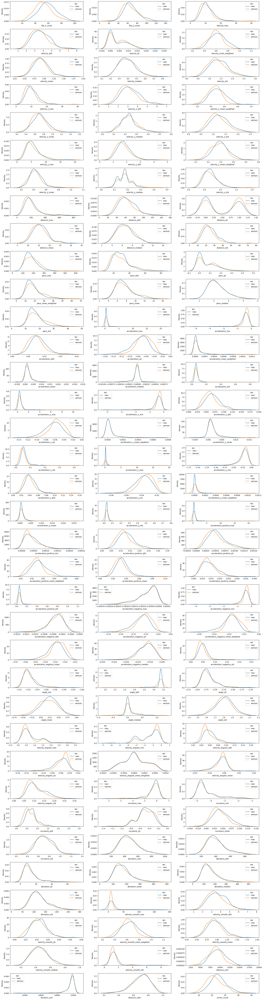

In [9]:
my_kdeplot(data, columns, 'sex')

## Impact of sex - points task

In [10]:
data = data_all[data_all['task_id'] == data_all['task_id']]

In [11]:
results = my_mannwhitney(data, columns, 'sex', ['man', 'woman'])
display(HTML(results.sort_values('z', ascending=False, key=pd.Series.abs).to_html()))

,Feature name,p,U,z,effsize,significant
90,curvature_std,< .001,"124,696.0000",6.0100,0.2000,True
68,acceleration_negative_mean_weighted,< .001,"79,977.0000",-5.4600,-0.1800,True
87,curvature_q95,< .001,"122,463.0000",5.4400,0.1800,True
89,curvature_mean,< .001,"122,251.0000",5.3900,0.1800,True
67,acceleration_negative_q5,< .001,"81,168.0000",-5.1500,-0.1700,True
45,acceleration_x_q5,< .001,"81,405.5000",-5.0900,-0.1700,True
37,acceleration_q5,< .001,"81,663.0000",-5.0200,-0.1700,True
80,velocity_angular_q95,< .001,"119,968.0000",4.8000,0.1600,True
69,acceleration_negative_mean,< .001,"83,301.0000",-4.6000,-0.1500,True
14,velocity_x_std,< .001,"119,127.0000",4.5800,0.1500,True


In [12]:
significant = results['Feature name'].values
for prefix in ['velocity', 'acceleration', 'flip', 'pace', 'angle', 'curvature', 'deviation', 'distance', 'duration', 'corner']:
    features = [x for x in significant if x.startswith(prefix)]
    print(prefix, len(features))

velocity 33
acceleration 38
flip 2
pace 7
angle 6
curvature 6
deviation 6
distance 8
duration 1
corner 1


In [13]:
results.significant.value_counts()

significant
True     61
False    47
Name: count, dtype: int64

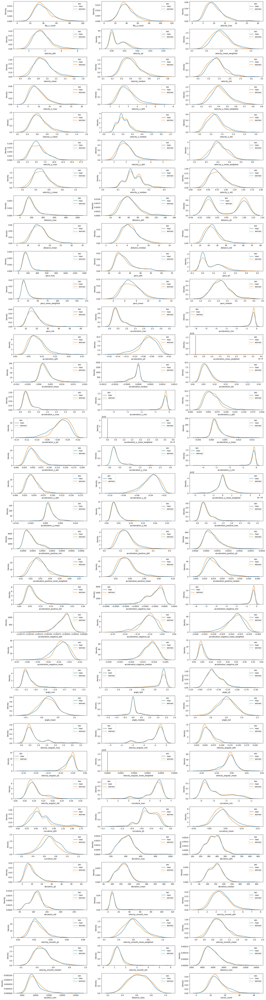

In [14]:
my_kdeplot(data, columns, 'sex')

## Impact of sex - prototype task

In [15]:
data = data_all[data_all['prototype_id'] == data_all['prototype_id']]

In [16]:
results = my_mannwhitney(data, columns, 'sex', ['man', 'woman'])
display(HTML(results.sort_values('z', ascending=False, key=pd.Series.abs).to_html()))

,Feature name,p,U,z,effsize,significant
89,curvature_mean,< .001,"4,530.0000",4.5400,0.3600,True
87,curvature_q95,0.002,"4,107.5000",3.1000,0.2400,True
85,curvature_max,0.012,"3,934.0000",2.5100,0.2000,True
83,velocity_angular_mean,0.017,"2,497.0000",-2.4000,-0.1900,True
81,velocity_angular_q5,0.018,"2,505.5000",-2.3700,-0.1900,True
7,velocity_median,0.021,"2,521.5000",-2.3100,-0.1800,True
32,pace_median,0.023,"3,869.0000",2.2800,0.1800,True
19,velocity_y_median,0.022,"2,540.0000",-2.2500,-0.1800,True
25,distance_median,0.027,"2,555.0000",-2.2000,-0.1700,True
80,velocity_angular_q95,0.03,"3,834.5000",2.1700,0.1700,True


In [17]:
results.significant.value_counts()

significant
False    91
True     17
Name: count, dtype: int64

In [18]:
significant = results['Feature name'].values
for prefix in ['velocity', 'acceleration', 'flip', 'pace', 'angle', 'curvature', 'deviation', 'distance', 'duration', 'corner']:
    features = [x for x in significant if x.startswith(prefix)]
    print(prefix, len(features))

velocity 33
acceleration 38
flip 2
pace 7
angle 6
curvature 6
deviation 6
distance 8
duration 1
corner 1


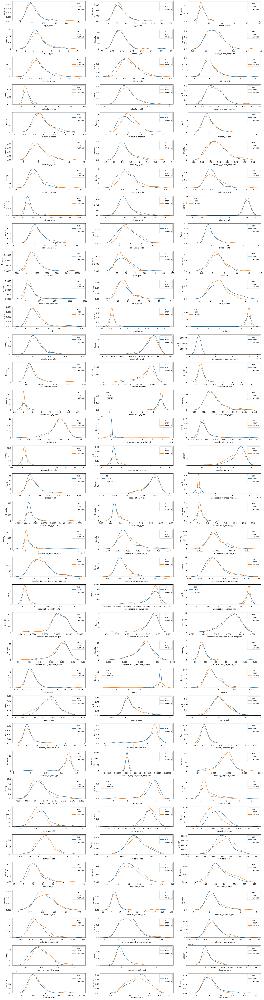

In [19]:
my_kdeplot(data, columns, 'sex')

## Sex differences - all tasks

In [20]:
results = my_mannwhitney(data_all, columns, 'sex', ['man', 'woman'])
results.sort_values('z', ascending=False, key=pd.Series.abs).head(15)

,Feature name,p,U,z,effsize,significant
87,curvature_q95,< .001,"365,104.0000",7.8700,0.2000,True
89,curvature_mean,< .001,"363,652.0000",7.7000,0.2000,True
80,velocity_angular_q95,< .001,"360,091.5000",7.2900,0.1900,True
81,velocity_angular_q5,< .001,"237,535.0000",-6.7500,-0.1700,True
45,acceleration_x_q5,< .001,"239,699.5000",-6.5000,-0.1700,True
68,acceleration_negative_mean_weighted,< .001,"239,804.0000",-6.4900,-0.1700,True
37,acceleration_q5,< .001,"241,192.0000",-6.3300,-0.1600,True
67,acceleration_negative_q5,< .001,"241,969.0000",-6.2400,-0.1600,True
90,curvature_std,< .001,"350,681.0000",6.2200,0.1600,True
71,acceleration_negative_std,< .001,"350,259.0000",6.1700,0.1600,True


In [21]:
results.significant.value_counts()

significant
True     74
False    34
Name: count, dtype: int64

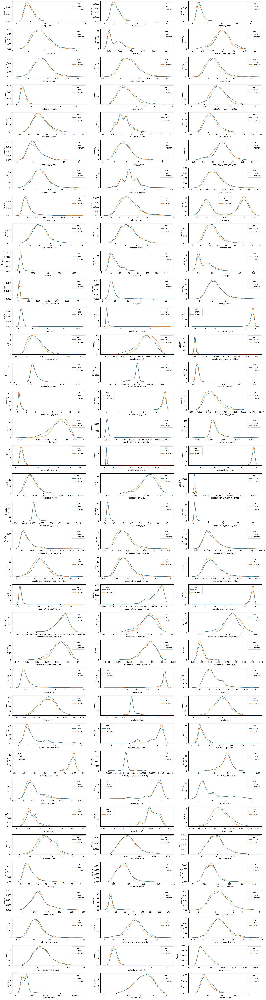

In [22]:
my_kdeplot(data_all, columns, 'sex')